### Forecasting Of Real Estate Price

Загрузка модулей и исходных данных

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_squared_error as mse
import warnings
warnings.filterwarnings('ignore')

%config InlineBackend.figure_format = 'svg'
%matplotlib inline

# Загрузка тренировочных и тестовых данных
data_train = pd.read_csv('data/train.csv')
data_test = pd.read_csv('data/test.csv')

### Обработка исходных данных 

In [2]:
data_train.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,B,B,33,7976,5,NaN,0,11,B,184966.930730
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,B,B,46,10309,1,240.0,1,16,B,300009.450063
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
3,5809,58,2.0,53.352981,52.731512,9.0,8,17.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,175616.227217
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2078.0,2,4,B,150226.531644


In [3]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
Id               10000 non-null int64
DistrictId       10000 non-null int64
Rooms            10000 non-null float64
Square           10000 non-null float64
LifeSquare       7887 non-null float64
KitchenSquare    10000 non-null float64
Floor            10000 non-null int64
HouseFloor       10000 non-null float64
HouseYear        10000 non-null int64
Ecology_1        10000 non-null float64
Ecology_2        10000 non-null object
Ecology_3        10000 non-null object
Social_1         10000 non-null int64
Social_2         10000 non-null int64
Social_3         10000 non-null int64
Healthcare_1     5202 non-null float64
Helthcare_2      10000 non-null int64
Shops_1          10000 non-null int64
Shops_2          10000 non-null object
Price            10000 non-null float64
dtypes: float64(8), int64(9), object(3)
memory usage: 1.5+ MB


In [4]:
data_train.columns

Index(['Id', 'DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare',
       'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
       'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1',
       'Helthcare_2', 'Shops_1', 'Shops_2', 'Price'],
      dtype='object')

In [5]:
# Размерность исходных данных (до чистки)
data_train.shape

(10000, 20)

Обработка параметров квартир: цена, площадь, количество комнат и других параметров

In [6]:
data_train.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.890500,56.315775,37.199645,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904460,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.839512,21.058732,86.241209,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1021.517264,1.493601,4.806341,92872.293865
min,0.00000,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.774881,22.769832,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.513310,32.781260,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.900625,45.128803,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,19.000000,641.065193,7480.592129,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


Из таблицы data_train.describe() видно, что максимальное значение LifeSquare = 7480.592129, а общая Square = 641.065193. Этого быть не может, чтобы жилая площадь была больше общей площади квартиры. Нужно приводить цены в порядок. Делаем допущение, что минимальная площадь квартиры 30 м2 (на основании открытой статистики по недвижимости).

In [7]:
# Обработка площадей
data_train.loc[(data_train['Square'] < 30) & (data_train['LifeSquare'] < 30) & (data_train['Rooms'] <= 1 ), 'Square'] = data_train.loc[data_train['Rooms'] <= 1, 'Square'].mean()
data_train.loc[(data_train['Square'] < 30) & (data_train['LifeSquare'] < 30) & (data_train['Rooms'] == 3 ), 'Square'] = data_train.loc[data_train['Rooms'] == 3, 'Square'].mean()
data_train.loc[(data_train['Square'] > 30) & (data_train['LifeSquare'] < 30), 'LifeSquare'] = data_train['Square']
# Общая площадь квартиры не может быть меньше жилой площади
data_train.loc[data_train['Square'] < data_train['LifeSquare'], 'LifeSquare'] = data_train['Square']
# Заполняем пустые значения поля жилой площади квартиры
data_train['LifeSquare'] = data_train['LifeSquare'].fillna(data_train['Square'])
# Минимальная площадь квартиры 30 м2
data_train = data_train.loc[data_train['Square'] >= 30, :]

Как видно из таблицы data_train.describe(), минимальная цена 59174.778028 (3 905 534,82 руб), максимальная 633233.466570 (41 793 408,36 руб). Сделаем допущение, что цена более 600 000 (39 600 000 руб) - это черезчур дорогая цена и это значение будет порогом "дороговизны", выше которого значения рассматривать не будем. Текущий курс 66 рублей за 1$

In [8]:
# Определение квартир с нормальными ценами
normal_price = data_train[(data_train['Price'] <= 600000)]['Price']
square_for_normal_price = data_train[(data_train['Price'] <= 600000)]['Square']
# Определение квартир с сомнительными ценами
suspicious_price = data_train[(data_train['Price'] > 600000)]['Price']
square_for_suspicious_price = data_train[(data_train['Price'] > 600000)]['Square']

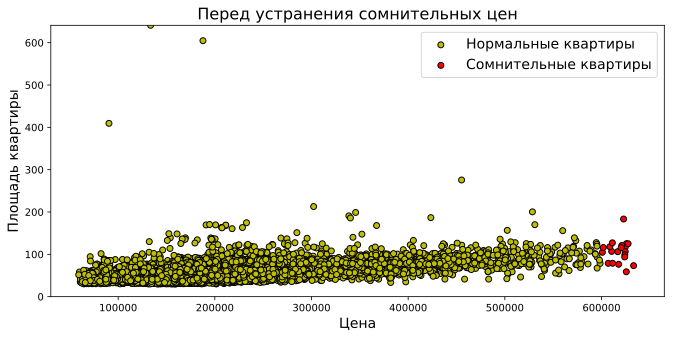

In [9]:
# Строим график цены от площади
plt.figure(figsize=(11, 5))
sc1 = plt.scatter(normal_price, square_for_normal_price, edgecolors='black', color='y', label="Нормальные квартиры")
sc2 = plt.scatter(suspicious_price, square_for_suspicious_price, edgecolors='black', color='r', label="Сомнительные квартиры")
plt.ylim(0, data_train['Square'].max())
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Площадь квартиры', fontsize=14)
plt.title('Перед устранения сомнительных цен', fontsize=16)
plt.legend(handles=[sc1, sc2], loc=1, fontsize=14)

Из графика видно, что сомнительных цен не так много, но к ним добавились еще квартиры с сомнительной площадью 641.065193 м2. Введем ограничение на площадь не более 120 м2

In [10]:
# Устраняем сомнительные цены
data_train = data_train.loc[data_train['Price'] <= 600000, :]
data_train.drop(data_train[data_train["Square"] >= 120].index, inplace=True)

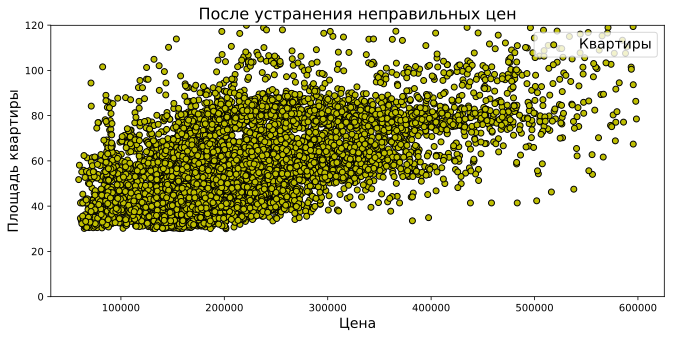

In [11]:
# Строим новый график цены от площади
plt.figure(figsize=(11, 5))
sc = plt.scatter(data_train['Price'], data_train['Square'], edgecolors='black', color='y', label="Квартиры")
plt.ylim(0, data_train['Square'].max())
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Площадь квартиры', fontsize=14)
plt.title('После устранения неправильных цен', fontsize=16)
first_legend = plt.legend(handles=[sc], loc=1, fontsize=14)

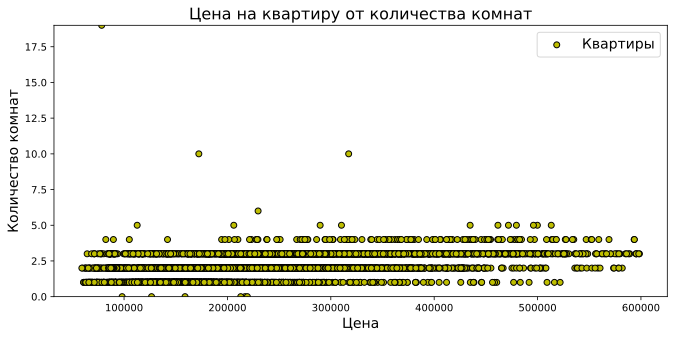

In [12]:
# Строим график цены от количества комнат
plt.figure(figsize=(11, 5))
sc = plt.scatter(data_train['Price'], data_train['Rooms'], edgecolors='black', color='y', label="Квартиры")
plt.ylim([0, data_train['Rooms'].max()])
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Количество комнат', fontsize=14)
plt.title('Цена на квартиру от количества комнат', fontsize=16)
first_legend = plt.legend(handles=[sc], loc=1, fontsize=14)

Из графика видно, что некоторые значения комнат сильно выбиваются от общих значений и которые явно не соответствуют цене. Например, при стоимости квартиры менее 100 000, а количество комнат 19, а так же есть квартиры с количеством комнат равным 0. Нужно почистить эти значения, ограничив верхний предел 10 комнатами.

In [13]:
# Обработка количества комнат
data_train = data_train.loc[data_train['Rooms'].between(1, 10), :]

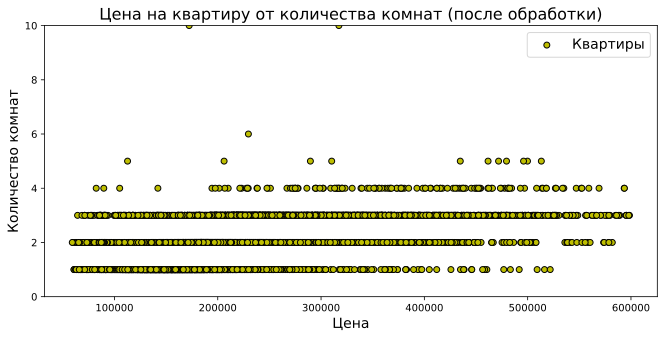

In [14]:
# Строим новый график цены от количества комнат
plt.figure(figsize=(11, 5))
sc = plt.scatter(data_train['Price'], data_train['Rooms'], edgecolors='black', color='y', label="Квартиры")
plt.ylim([0, data_train['Rooms'].max()])
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Количество комнат', fontsize=14)
plt.title('Цена на квартиру от количества комнат (после обработки)', fontsize=16)
first_legend = plt.legend(handles=[sc], loc=1, fontsize=14)

In [15]:
# Определение квартир с нормальной площадью кухни
normal_kitchenSquare = data_train[(data_train['Square'] >= data_train['KitchenSquare'])]['Price']
kitchenSquare_for_normal_price = data_train[(data_train['Square'] >= data_train['KitchenSquare'])]['KitchenSquare']
# Определение квартир с сомнительной площадью кухни
suspicious_kitchenSquare = data_train[(data_train['Square'] < data_train['KitchenSquare'])]['Price']
kitchenSquare_for_suspicious_price = data_train[(data_train['Square'] < data_train['KitchenSquare'])]['KitchenSquare']

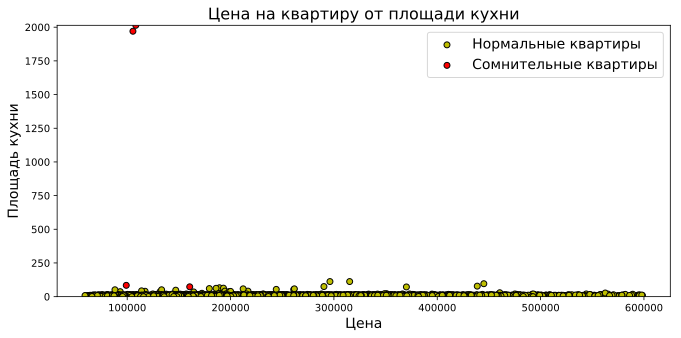

In [16]:
# Строим график цены от площади кухни
plt.figure(figsize=(11, 5))
sc1 = plt.scatter(normal_kitchenSquare, kitchenSquare_for_normal_price, edgecolors='black', color='y', label="Нормальные квартиры")
sc2 = plt.scatter(suspicious_kitchenSquare, kitchenSquare_for_suspicious_price, edgecolors='black', color='r', label="Сомнительные квартиры")
plt.ylim(0, data_train['KitchenSquare'].max())
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Площадь кухни', fontsize=14)
plt.title('Цена на квартиру от площади кухни', fontsize=16)
plt.legend(handles=[sc1, sc2], loc=1, fontsize=14)

Из графика видно, что есть явно ошибочные значения параметра площади кухни. Эти данные нужно почистить. Так же нужна проверка, чтобы площадь кухни не была больше общей площади квартиры.

In [17]:
# Площадь кухни не может быть больше общей. Делаем допущение, чтобы получить более адекватное значение 
# (-20% от общей площади на туалет, ванную и т.п.)
data_train.loc[data_train['Square'] < data_train['KitchenSquare'], 'KitchenSquare'] = data_train['Square'] - data_train['LifeSquare'] - data_train['Square'] * 0.2

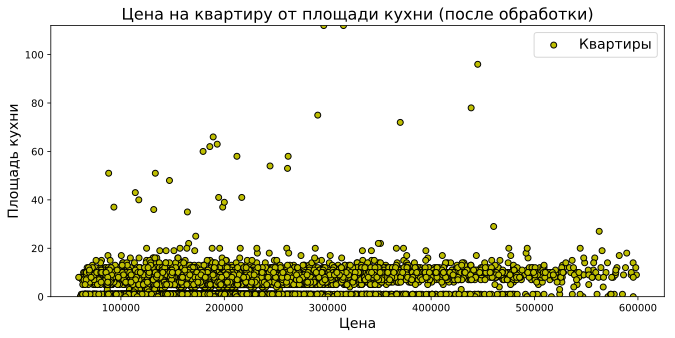

In [18]:
# Строим новый график цены от площади кухни
plt.figure(figsize=(11, 5))
sc = plt.scatter(data_train['Price'], data_train['KitchenSquare'], edgecolors='black', color='y', label="Квартиры")
plt.ylim([0, data_train['KitchenSquare'].max()])
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Площадь кухни', fontsize=14)
plt.title('Цена на квартиру от площади кухни (после обработки)', fontsize=16)
first_legend = plt.legend(handles=[sc], loc=1, fontsize=14)

In [19]:
# Определение квартир, у которых этаж квартиры выше количества этажей в доме
normal_floor = data_train[(data_train['Floor'] <= data_train['HouseFloor'])]['Price']
floor_for_normal_price = data_train[(data_train['Floor'] <= data_train['HouseFloor'])]['Floor']
# Определение квартир с сомнительным этажем
suspicious_floor = data_train[(data_train['Floor'] > data_train['HouseFloor'])]['Price']
floor_for_suspicious_price = data_train[(data_train['Floor'] > data_train['HouseFloor'])]['Floor']

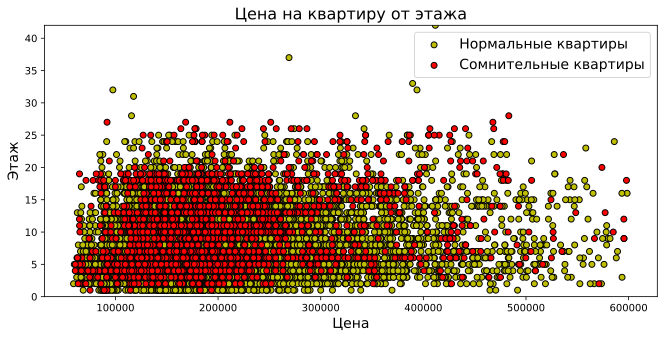

In [20]:
# Строим график цены от этажа
plt.figure(figsize=(11, 5))
sc1 = plt.scatter(normal_floor, floor_for_normal_price, edgecolors='black', color='y', label="Нормальные квартиры")
sc2 = plt.scatter(suspicious_floor, floor_for_suspicious_price, edgecolors='black', color='r', label="Сомнительные квартиры")
plt.ylim(0, data_train['Floor'].max())
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Этаж', fontsize=14)
plt.title('Цена на квартиру от этажа', fontsize=16)
plt.legend(handles=[sc1, sc2], loc=1, fontsize=14)

In [21]:
# Этаж квартиры не может быть больше этажности дома
data_train.loc[data_train['HouseFloor'] < data_train['Floor'], 'Floor'] = data_train['HouseFloor'].mean()

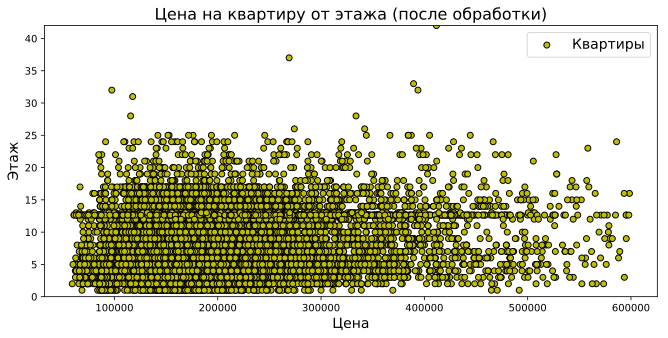

In [22]:
# Строим новый график цены от этажа
plt.figure(figsize=(11, 5))
sc = plt.scatter(data_train['Price'], data_train['Floor'], edgecolors='black', color='y', label="Квартиры")
plt.ylim([0, data_train['Floor'].max()])
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Этаж', fontsize=14)
plt.title('Цена на квартиру от этажа (после обработки)', fontsize=16)
first_legend = plt.legend(handles=[sc], loc=1, fontsize=14)

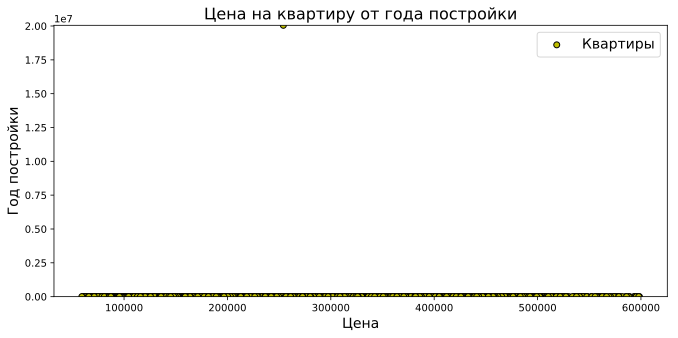

In [23]:
# Строим график цены от года постройки дома
plt.figure(figsize=(11, 5))
sc = plt.scatter(data_train['Price'], data_train['HouseYear'], edgecolors='black', color='y', label="Квартиры")
plt.ylim([0, data_train['HouseYear'].max()])
plt.xlabel('Цена', fontsize=14)
plt.ylabel('Год постройки', fontsize=14)
plt.title('Цена на квартиру от года постройки', fontsize=16)
first_legend = plt.legend(handles=[sc], loc=1, fontsize=14)

In [24]:
# На графике явно видно, что есть ошибки в годах постройки здания. Исправляем год постройки.
data_train.loc[data_train['HouseYear'] > 2030, 'HouseYear'] = 2000

In [25]:
# Дозаполнение недостающих параметров
# Делаем допущение, что параметр Healthcare_1 слабо влияет на стоимость квартиры и его можно грубо дозаполнить средним значением
data_train['Healthcare_1'] = data_train['Healthcare_1'].fillna(data_train['Healthcare_1'].mean())

In [26]:
# Делаем обработку не числовых параметров квартир (Ecology_2, Ecology_3, Shops_2)
data_train = pd.get_dummies(data_train)

Добавление дополнительных параметров

In [27]:
# Эффективная площадь
data_train['EffectiveArea'] = data_train['LifeSquare'] / data_train['Square']
# Площадь квартиры без кухни
data_train['AreaDiff'] = data_train['Square'] - data_train['KitchenSquare']
# Доля площади кухни в общей площади квартиры
data_train['KitchenRatio'] = data_train['KitchenSquare'] / data_train['Square']
# Средний размер комнаты
data_train['RoomSize'] = data_train['LifeSquare'] / data_train['Rooms']

In [28]:
# Размерность данных после обработки (чистки)
data_train.shape

(9859, 27)

In [29]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9859 entries, 0 to 9999
Data columns (total 27 columns):
Id               9859 non-null int64
DistrictId       9859 non-null int64
Rooms            9859 non-null float64
Square           9859 non-null float64
LifeSquare       9859 non-null float64
KitchenSquare    9859 non-null float64
Floor            9859 non-null float64
HouseFloor       9859 non-null float64
HouseYear        9859 non-null int64
Ecology_1        9859 non-null float64
Social_1         9859 non-null int64
Social_2         9859 non-null int64
Social_3         9859 non-null int64
Healthcare_1     9859 non-null float64
Helthcare_2      9859 non-null int64
Shops_1          9859 non-null int64
Price            9859 non-null float64
Ecology_2_A      9859 non-null uint8
Ecology_2_B      9859 non-null uint8
Ecology_3_A      9859 non-null uint8
Ecology_3_B      9859 non-null uint8
Shops_2_A        9859 non-null uint8
Shops_2_B        9859 non-null uint8
EffectiveArea    9859 no

Получили обработанные данные без пустых срок. Теперь можно приступать к построению модели.

### Обучение модели

In [30]:
# Разделение данных на обучающую и тестовую выборки
train, valid = train_test_split(data_train, test_size=0.3, random_state=42)

In [31]:
# Список исходных полей + обработанные dummies + дополнительно добавленные поля
fts = ['Square', 'Rooms', 'LifeSquare', 'Floor', 'HouseFloor', 
       'KitchenSquare', 'HouseYear', 'HouseYear', 'Ecology_1', 'Social_1', 
       'Social_2', 'Social_3', 'Healthcare_1', 'Helthcare_2', 'Shops_1', 
       'Ecology_2_A', 'Ecology_2_B', 'Ecology_3_A', 'Ecology_3_B', 'Shops_2_A', 
       'Shops_2_B', 'EffectiveArea', 'AreaDiff', 'KitchenRatio', 'RoomSize'
      ]

Используем модель RandomForestRegressor

In [32]:
model = RandomForestRegressor(n_estimators=20, max_depth=10, min_samples_leaf=2, random_state=42)

In [33]:
model.fit(train.loc[:, fts], train['Price'])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=10,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=None,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

In [34]:
# Проводим предсказание на обучающей выборке
pred = model.predict(train.loc[:, fts])

In [35]:
# Проводим предсказание на тестовой выборке
pred_valid = model.predict(valid.loc[:, fts])

In [36]:
print('Точность предсказания на выборках:\nОбучающая: {}, Тестовая: {}'.format(r2(train['Price'], pred), r2(valid['Price'], pred_valid)))

Точность предсказания на выборках:
Обучающая: 0.8431425026507126, Тестовая: 0.7243128105756629


Итого, получили точность предсказания на тестовой выборке на модели RandomForestRegressor

Пробуем для теста продукт компании Яндекс - CatBoost (https://tech.yandex.com/catboost/)

In [37]:
from catboost import CatBoostRegressor

In [38]:
model_yandex = CatBoostRegressor(max_depth=10, random_state=42, verbose=False)

In [39]:
# Данная модель показывает выше точность на исходных полях без добавления дополнительных
fts = ['Square', 'Rooms', 'LifeSquare', 'Floor', 'HouseFloor', 
       'KitchenSquare', 'HouseYear', 'HouseYear', 'Ecology_1', 'Social_1', 
       'Social_2', 'Social_3', 'Healthcare_1', 'Helthcare_2', 'Shops_1', 
       'Ecology_2_A', 'Ecology_2_B', 'Ecology_3_A', 'Ecology_3_B', 'Shops_2_A', 
       'Shops_2_B'
      ]

In [40]:
model_yandex.fit(train.loc[:, fts], train['Price'])

In [41]:
# Проводим предсказание на обучающей выборке
pred = model_yandex.predict(train.loc[:, fts])

In [42]:
# Проводим предсказание на тестовой выборке
pred_valid = model_yandex.predict(valid.loc[:, fts])

In [43]:
print('Точность предсказания на выборках:\nОбучающая: {}, Тестовая: {}'.format(r2(train['Price'], pred), r2(valid['Price'], pred_valid)))

Точность предсказания на выборках:
Обучающая: 0.8194390942390585, Тестовая: 0.7564986802845285


Модель на основе CatBoostRegressor показала результат выше, чем RandomForestRegressor, поэтому остановимся на данной модели.

### Предсказания на тестовый данных

Переносим обработку данных, которую мы делали на тренировочном наборе data_train

In [44]:
# Размерность тестовых данных (до обработки)
data_test.shape

(5000, 19)

In [45]:
# Обработка площадей
data_test.loc[(data_test['Square'] < 30) & (data_test['LifeSquare'] < 30) & (data_test['Rooms'] <= 1 ), 'Square'] = data_test.loc[data_test['Rooms'] <= 1, 'Square'].mean()
data_test.loc[(data_test['Square'] < 30) & (data_test['LifeSquare'] < 30) & (data_test['Rooms'] == 3 ), 'Square'] = data_test.loc[data_test['Rooms'] == 3, 'Square'].mean()
data_test.loc[(data_test['Square'] > 30) & (data_test['LifeSquare'] < 30), 'LifeSquare'] = data_test['Square']

# Общая площадь квартиры не может быть меньше жилой площади
data_test.loc[data_test['Square'] < data_test['LifeSquare'], 'LifeSquare'] = data_test['Square']

# Заполняем пустые значения поля жилой площади квартиры
data_test['LifeSquare'] = data_test['LifeSquare'].fillna(data_test['Square'])

# Площадь кухни не может быть больше общей. Делаем допущение, чтобы получить более адекватное значение 
# (-20% от общей площади на туалет, ванную и т.п.)
data_test.loc[data_test['Square'] < data_test['KitchenSquare'], 'KitchenSquare'] = data_test['Square'] - data_test['LifeSquare'] - data_test['Square'] * 0.2

# Этаж квартиры не может быть больше этажности дома
data_test.loc[data_test['HouseFloor'] < data_test['Floor'], 'Floor'] = data_test['HouseFloor'].mean()

# Исправляем год постройки.
data_test.loc[data_test['HouseYear'] > 2030, 'HouseYear'] = 2000

# Дозаполнение недостающих параметров
# Делаем допущение, что параметр Healthcare_1 слабо влияет на стоимость квартиры и его можно грубо дозаполнить средним значением
data_test['Healthcare_1'] = data_test['Healthcare_1'].fillna(data_test['Healthcare_1'].mean())

# Делаем обработку не числовых параметров квартир (Ecology_2, Ecology_3, Shops_2)
data_test = pd.get_dummies(data_test)

In [46]:
# Размерность тестовых данных (после обработки)
data_test.shape

(5000, 22)

In [47]:
# Проводим предсказание на тестовых данных
pred_test = model_yandex.predict(data_test.loc[:, fts])

In [48]:
data_test['Price'] = pred_test

In [49]:
# Сохраняем полученные предсказания
data_test.loc[:, ['Id', 'Price']].to_csv('data/NLitvak_predictions.csv', index=None)